# scAdam model explainability

Model explainability refers to the ability to understand and articulate how a machine learning model makes its predictions or decisions.

**scNoah** uses [SHAP](https://shap.readthedocs.io/en/latest/index.html) (SHapley Additive exPlanations) for model explainability analysis.

SHAP values are derived from cooperative game theory, specifically using Shapley values, which quantify the contribution of each player (or feature/gene) to the total payoff (or prediction). 
This approach allows for a fair distribution of contributions among features, similar to how players in a coalition share the rewards based on their input.

The SHAP framework operates under the principle that the prediction for an instance can be expressed as the sum of the average prediction and the contributions of each feature. 
Mathematically, this can be represented as:
$$ prediction = f_0 + \sum_{i=1}^M f_i $$
where <br>
$prediction$ is the model's prediction, <br>
$f_0$ is the expected value of the output, <br> 
$f_i$ are the SHAP values for each feature.

SHAP provides a framework for both local explainability and global explainability in machine learning models. <br>
1) **Local Explainability**: Focuses on explaining individual predictions (cells) made by the model. It seeks to clarify why a specific output was generated for a given input.
2) **Global Explainability**: Aims to provide an overall understanding of the model's behavior across all predictions (cells), identifying the main factors that influence outputs.

In [1]:
# Python packages
import warnings
warnings.simplefilter('ignore')

import scanpy as sc
import scparadise
import shap
import os
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd

sc.set_figure_params(dpi = 120)

## Recommendations about dataset 
Our models trained using shifted logarithm normalized data. <br>
We recommend shifted logarithm data normalization method to proper usage of our models: <br>
sc.pp.normalize_total(adata, target_sum=None) <br>
sc.pp.log1p(adata) <br>
adata.raw = adata

In [2]:
# Load dataset from 10x Genomics
url = "https://cf.10xgenomics.com/samples/cell-exp/6.1.0/10k_PBMC_3p_nextgem_Chromium_X/10k_PBMC_3p_nextgem_Chromium_X_filtered_feature_bc_matrix.h5"
adata = sc.read_10x_h5("dataset.h5", backup_url = url)
adata.var_names_make_unique()
adata

AnnData object with n_obs × n_vars = 11996 × 36601
    var: 'gene_ids', 'feature_types', 'genome'

## QC

In [3]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

In [4]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

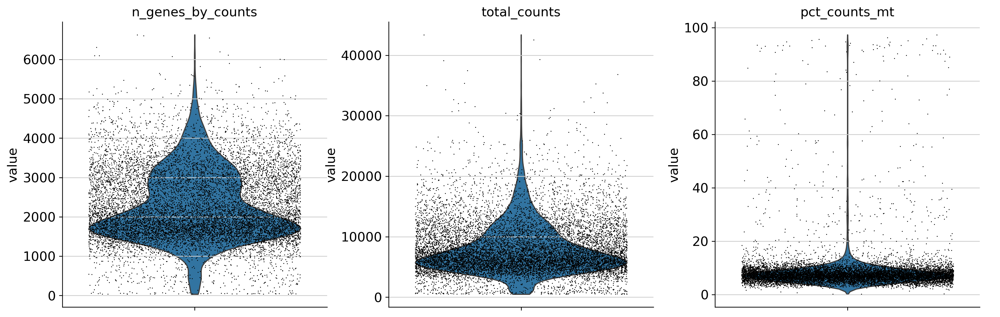

In [5]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

In [6]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

In [7]:
# Detect doublets
sc.pp.scrublet(adata)

In [8]:
# Remove doublets + other QC metrics
adata = adata[adata.obs['predicted_doublet'] == False]
sc.pp.filter_cells(adata, max_genes = 5000)
sc.pp.filter_cells(adata, max_counts = 20000)
adata = adata[adata.obs['pct_counts_mt'] < 15]

## Normalization, HVG, neighbors, PCA, UMAP
We recommend using shifted logarithm data normalization as described here.

In [9]:
# Saving count data
adata.layers["counts"] = adata.X.copy()
# Normalization (shifted logarithm)
sc.pp.normalize_total(adata, target_sum=None)
sc.pp.log1p(adata) 
# scParadise use normalized data in adata.raw!!!
adata.raw = adata
# HVG
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
# PCA
sc.tl.pca(adata)
# Nearest neighbors analysis
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)
# UMAP
sc.tl.umap(adata)

## Cell type prediction using scAdam

In [10]:
# Available models for cell type annotation
df = scparadise.scadam.available_models()
# Show models related to humans
df_human = df[df['Tissue/Model name'].str.startswith('Human_')]
df_human

,Tissue/Model name,Description,Suspension,Accuracy,Balanced Accuracy,Number of Levels
0,Human_PBMC,Peripheral blood mononuclear cells of healthy ...,cells,0.979,0.979,3
1,Human_BMMC,Bone marrow mononuclear cell of healthy adults,cells,0.947,0.942,3
2,Human_Heart,Human heart CITE-seq analysis of healthy and d...,cells,0.957,0.956,2
3,Human_Lung,Core Human Lung Cell Atlas,cells,0.965,0.964,5
4,Human_Lung_Cancer,Extended single-cell lung cancer atlas (LuCA),cells,0.937,0.936,3
5,Human_oropharyngeal_SCC,Oropharyngeal HPV+/HPV- squamous cell carcinom...,cells,0.972,0.968,2
6,Human_Retina,Single cell atlas of the human retina,cells,0.984,0.979,4


In [11]:
# Download model for cell type prediction
scparadise.scadam.download_model('Human_PBMC', save_path='')

In [12]:
# Predict cell types using trained model
adata = scparadise.scadam.predict(adata, 
                                  path_model = 'Human_PBMC_scAdam/')

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Successfully loaded model

Successfully added predicted celltype_l1 and cell type probabilities
Successfully added predicted celltype_l2 and cell type probabilities
Successfully added predicted celltype_l3 and cell type probabilities


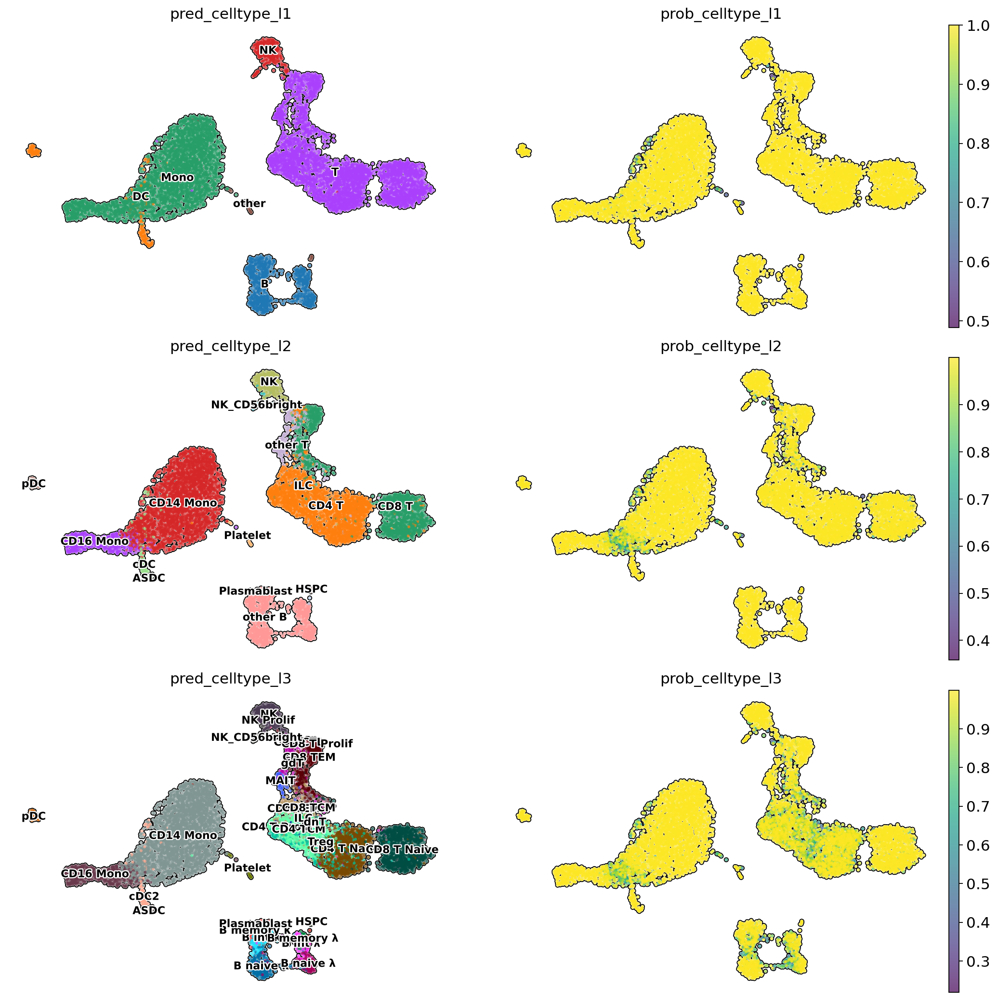

In [13]:
# Visualise predicted cell types levels and prediction probabilities
sc.set_figure_params(figsize=[8, 5])
sc.pl.embedding(adata, 
                color = [
                    'pred_celltype_l1',
                    'prob_celltype_l1',
                    'pred_celltype_l2',
                    'prob_celltype_l2',
                    'pred_celltype_l3',
                    'prob_celltype_l3'
                ],
                basis = 'X_umap',
                frameon = False,
                add_outline = True,
                legend_loc = 'on data',
                legend_fontsize = 10,
                legend_fontoutline = 2,
                ncols = 2,
                size = 30,
                wspace = 0, 
                hspace = 0.1)

## Create explanations matrix
Compute [SHAP values](https://shap.readthedocs.io/en/latest/index.html) for a specific cell type predicted using scAdam model.

In [14]:
# Compute explanations for CD8+ T cells
random_state = 0
num_cells = 100
explanations  = scparadise.scnoah.explain(adata,
                                          celltype = 'CD8 T',
                                          path_model = 'Human_PBMC_scAdam/',
                                          num_cells = num_cells,
                                          random_state = random_state)

Successfully loaded list of genes used for training model
Successfully loaded dictionary of dataset annotations
Successfully loaded model
Cell type "CD8 T" was successfully selected from pred_celltype_l2


PermutationExplainer explainer: 101it [02:27,  1.56s/it]                                                                

The explanations for "CD8 T" have been completed


In [15]:
# General explainability
# Calculate gene impoortances
gene_importances = scparadise.scnoah.feature_importance(explanations,
                                                         path_model = 'Human_PBMC_scAdam/')
# Show 15 most important genes for CD8+ T cells annotation
gene_importances.head(15)

,gene_name,gene_importance
76,GZMK,0.284200
593,CCL5,0.221275
108,GZMA,0.082325
539,CD8A,0.078000
425,IL7R,0.051650
40,CCR7,0.048450
72,NKG7,0.041350
403,CD8B,0.040450
116,TIGIT,0.033150
220,ITGB1,0.025675


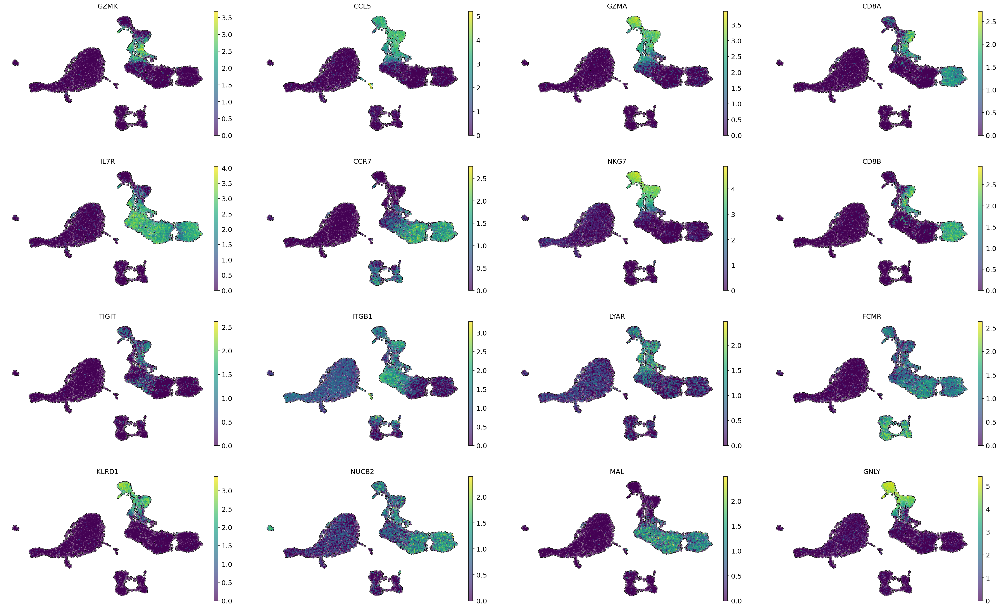

In [16]:
# Visualization of gene importancies on cell embeddings
sc.pl.embedding(adata,
                color = gene_importances.head(16)['gene_name'],
                basis = 'X_umap',
                frameon = False,
                add_outline = True,
                size = 30,
                ncols=4)

gene_importances indicate the significance of the genes CD8A and CD8B for the annotation of CD8+ T cells, which makes sense since these genes are markers of these cells. Additionally, among the genes with high gene importance values are markers for various subtypes of CD8+ T cells. GZMK, GZMA, CCL5, NKG7, and KLRD1 are markers of memory CD8+ T cells, while IL7R and CCR7 are markers of naive CD8+ T cells.

## Analysis of explanations
1) **Positive** SHAP value indicates that a particular feature (gene) has a significant impact on the model's prediction for a specific instance (cell type).
2) **Negative** SHAP value indicates that a specific feature (gene) has a detrimental effect on the model's prediction for a given instance (cell type).

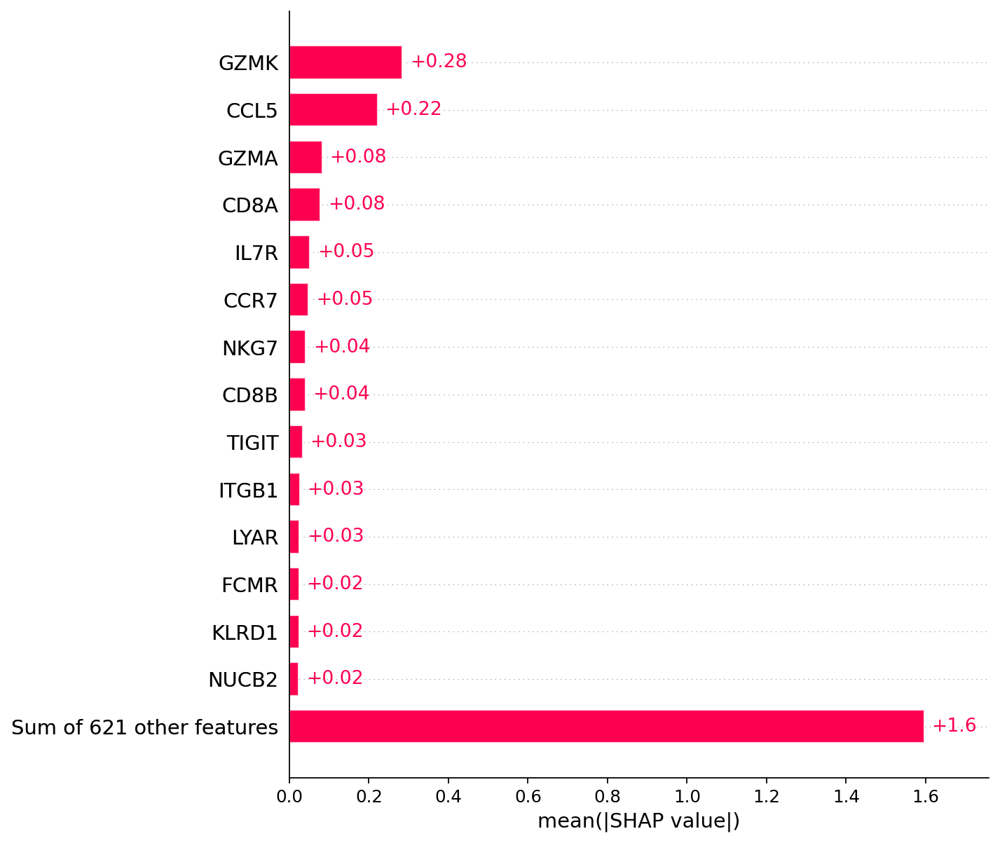

In [17]:
# Visualization of explanations
# For the annotation of CD8+ T cells, the following genes are of the greatest importance: 
plt.grid(visible=False, axis='both')
shap.plots.bar(explanations, max_display=15)

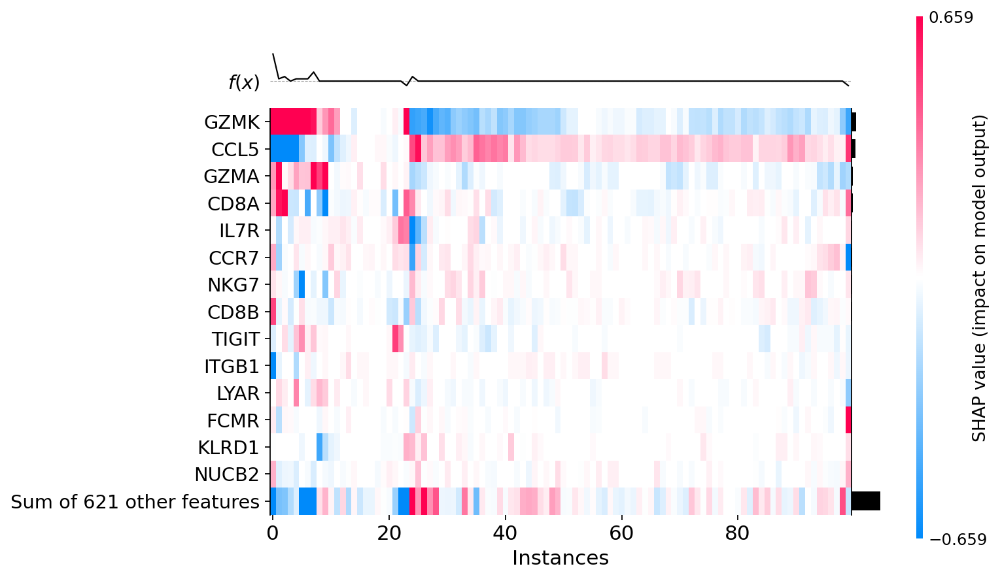

In [18]:
# It is also possible to display SHAP values for individual cells
shap.plots.heatmap(explanations, max_display=15, show=False)
plt.grid(visible=False, axis='both')

### Difference between CD8+ T cells
The difference in SHAP values indicates the presence of at least two different groups of CD8+ T cells. <br>
1) Positive SHAP values of CCL5 and Negative SHAP values of GZMK
2) Positive or 0 SHAP values of GZMK and Negative or 0 SHAP values of CCL5
For individual cells, SHAP values can be displayed along with the levels of gene expression.

<div class="alert alert-warning">
<b>Warning!</b>  <br> 
    `shap.plots.heatmap` makes clusterization automatically. <br> 
    To find the cell number in explanations, it is necessary to perform a similar clustering using `hclust`. <br>
    `explanations.hclust()` <br>
    Then you can find the cell using the instance number from a `shap.plots.heatmap`.
</div>

5

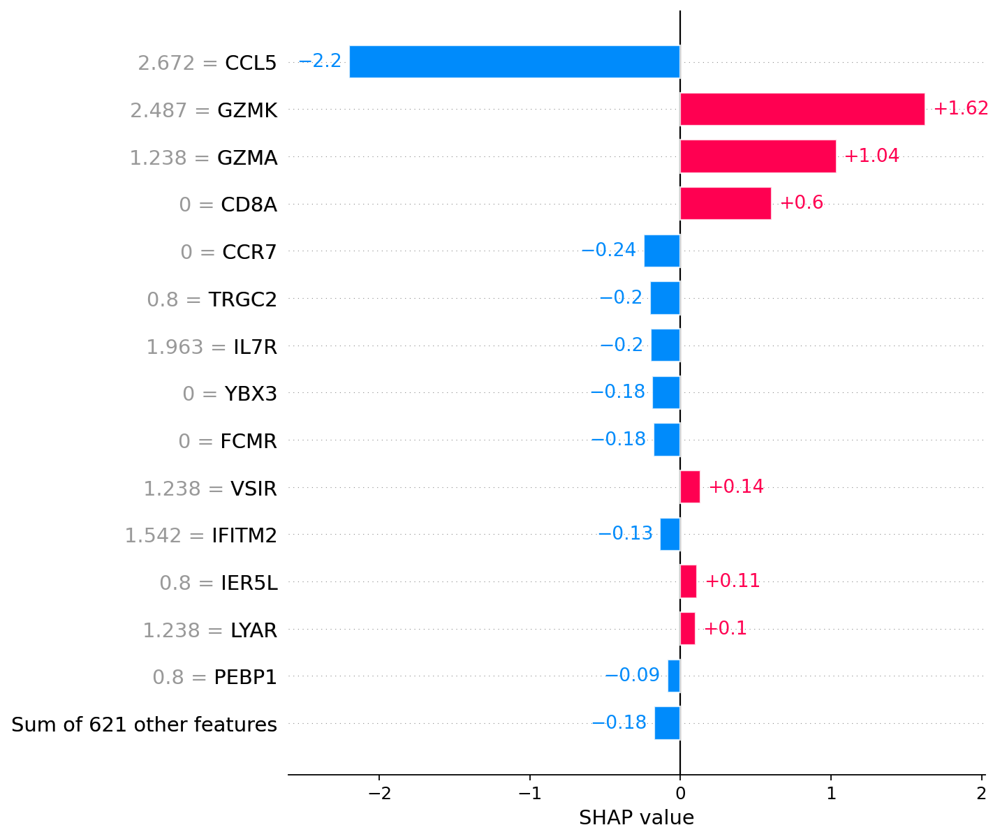

In [19]:
# Memory CD8+ T cell
# Left column of numbers (near gene names) represents gene expression
shap.plots.bar(explanations[explanations.hclust()[1]], max_display=15, show=False)
plt.grid(visible=False, axis='both')
explanations.hclust()[1] # Actual cell from explanations

91

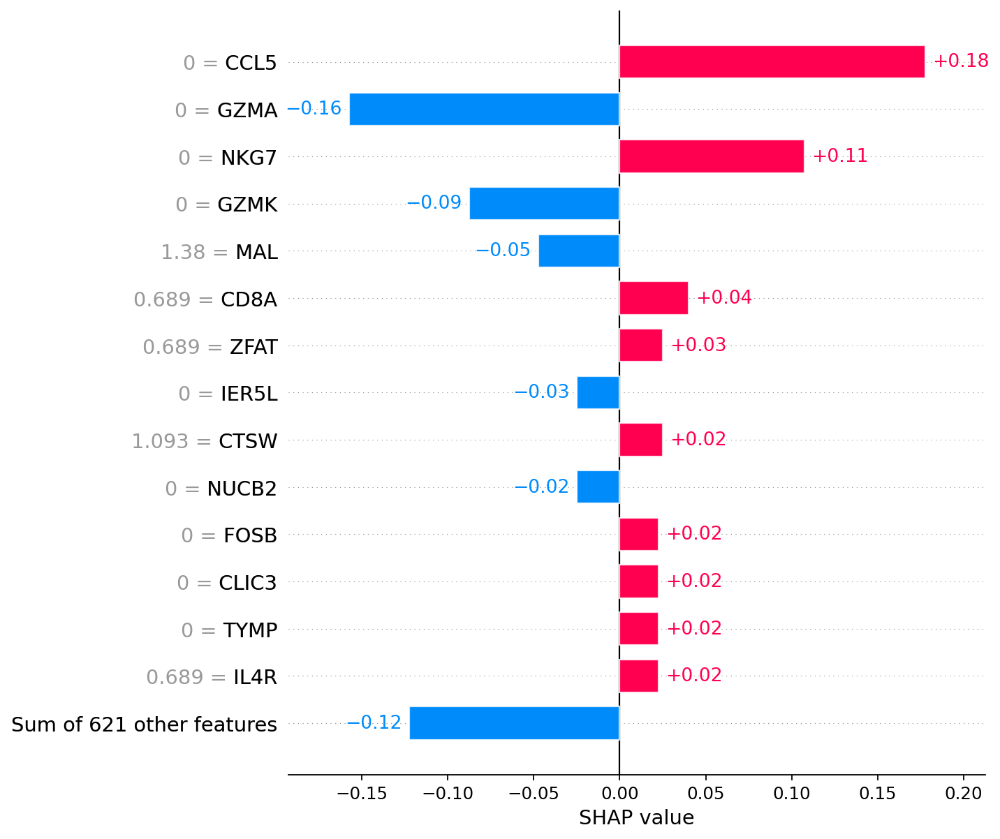

In [21]:
# Naive CD8+ T cell
# Left column of numbers (near gene names) represents gene expression
shap.plots.bar(explanations[explanations.hclust()[70]], max_display=15, show=False)
plt.grid(visible=False, axis='both')
explanations.hclust()[70] # Actual cell from explanations

1) For the annotation of cell 1, the most significant factors are the presence of GZMK and GZMA expression.
2) For the annotation of cell 70, the most significant factors are the absence of CCL5 and NKG7 expression.

In [22]:
# Extract the same 100 cells from a dataset
adata_subset = adata[adata.obs['pred_celltype_l2'] == 'CD8 T'].copy()
indexes = pd.DataFrame(index = adata_subset.obs_names).sample(n = num_cells, axis = 0, random_state = random_state).index.tolist()
adata_subset = adata_subset[indexes]

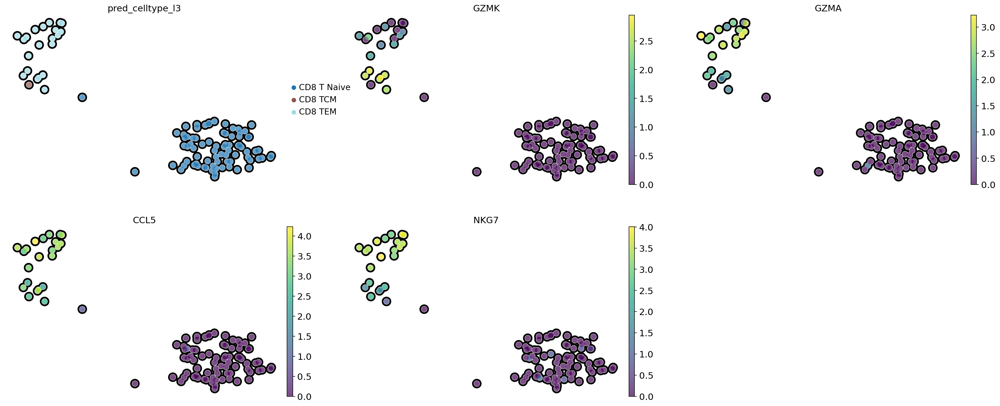

In [23]:
# Visualization of gene importances on cell embeddings
# CD8 TCM - central memory
# CD8 TEM - effector memory
sc.pl.embedding(adata_subset,
                color = ['pred_celltype_l3', 
                         'GZMK', 
                         'GZMA',
                         'CCL5', 
                         'NKG7'],
                basis = 'X_umap',
                frameon = False,
                add_outline = True,
                legend_loc = 'right margin',
                palette = 'tab20',
                ncols = 3,
                size = 300)

## Marker genes search using gene importances


In [24]:
# Compute explanations for plasmacytoid dendritic cells (pDC)
explanations  = scparadise.scnoah.explain(adata,
                                          celltype = 'pDC',
                                          num_cells = 75,
                                          path_model = 'Human_PBMC_scAdam/')

Successfully loaded list of genes used for training model
Successfully loaded dictionary of dataset annotations
Successfully loaded model
Cell type "pDC" was successfully selected from pred_celltype_l2


PermutationExplainer explainer: 76it [01:43,  1.52s/it]                                                                 

The explanations for "pDC" have been completed


In [25]:
# Calculate gene impoortances
gene_importances = scparadise.scnoah.feature_importance(explanations,
                                                         path_model = 'Human_PBMC_scAdam/')
# Show 10 most important genes for pDC cell annotation
gene_importances.head(10)

,gene_name,gene_importance
507,LINC00996,0.003733
449,SMPD3,0.001244
258,SERPINF1,0.001244
372,GZMB,0.001244
283,GAS6,0.001244
562,HLA-DQA1,0.001244
344,PTCRA,0.001244
125,TSPAN13,0.001244
91,APP,0.001244
318,AXL,0.001244


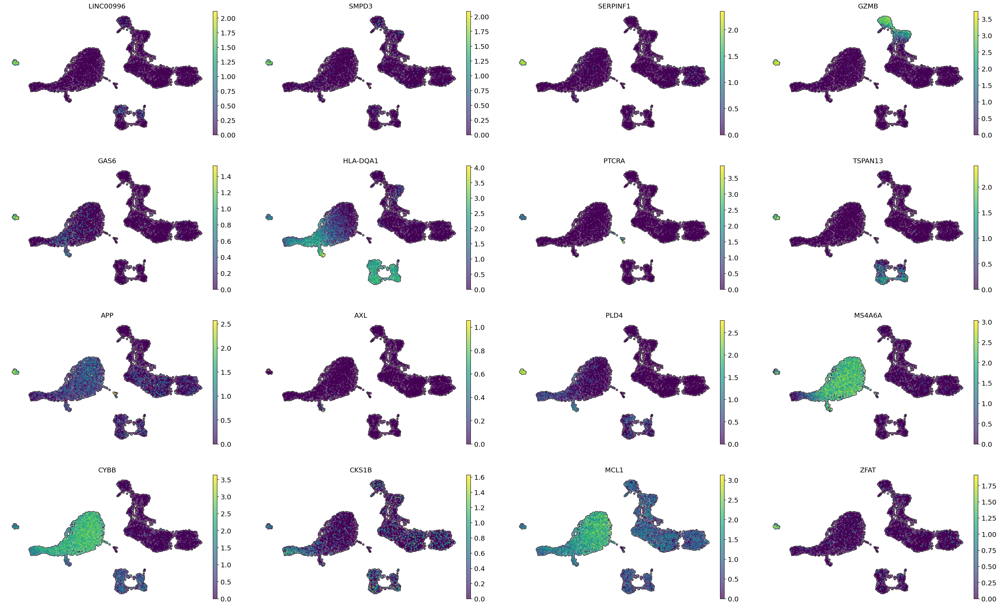

In [26]:
# Visualization of gene importances on cell embeddings
sc.pl.embedding(adata,
                color = gene_importances.head(16)['gene_name'],
                basis = 'X_umap',
                frameon = False,
                add_outline = True,
                size = 30,
                ncols = 4)

LINC00996, SMPD3, SERPINF1, GAS6, TSPAN13, APP, PLD4, and ZFAT, which have high gene importance values, can be considered marker genes for pDC.

In [27]:
# Save anndata with predicted annotations
adata.write_h5ad('adata_predicted.h5ad')

In [28]:
import session_info
session_info.show()